In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2013


In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,1.60,2.35,2.48,1.54,0.90,0.67,1.19,1.09,0.97,0.98,0.89,1.29
1,1.0,1.72,2.32,2.43,1.70,1.16,0.92,1.34,1.24,1.15,1.17,1.10,1.36
2,1.5,1.84,2.30,2.39,1.84,1.40,1.15,1.47,1.38,1.31,1.35,1.29,1.44
3,2.0,1.94,2.30,2.38,1.95,1.59,1.33,1.58,1.50,1.44,1.50,1.45,1.51
4,2.5,2.03,2.32,2.38,2.05,1.73,1.47,1.67,1.61,1.56,1.62,1.58,1.59


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,2.708350,2.743700,2.743600,2.629800,2.548000,2.347550,2.400000,2.478700,2.452250,2.480850,2.474250,2.446200
std,28.939592,0.175925,0.096587,0.079805,0.158314,0.233509,0.252416,0.202152,0.232064,0.242368,0.240307,0.249499,0.220883
min,0.500000,1.600000,2.300000,2.380000,1.540000,0.900000,0.670000,1.190000,1.090000,0.970000,0.980000,0.890000,1.290000
25%,25.375000,2.750000,2.760000,2.760000,2.660000,2.600000,2.377500,2.440000,2.530000,2.490000,2.520000,2.510000,2.477500
50%,50.250000,2.760000,2.780000,2.770000,2.680000,2.620000,2.430000,2.470000,2.550000,2.530000,2.560000,2.560000,2.520000
75%,75.125000,2.770000,2.780000,2.780000,2.690000,2.630000,2.460000,2.480000,2.570000,2.550000,2.580000,2.580000,2.540000
max,100.000000,2.770000,2.790000,2.780000,2.690000,2.640000,2.470000,2.490000,2.580000,2.560000,2.590000,2.590000,2.550000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,2.610616,1.683643,1.365151,2.407312,3.551231,4.407701,3.445201,3.753995,4.161822,4.150113,4.298379,3.974472
Jan,2.610616,0.030950,0.016510,0.013377,0.027762,0.040900,0.043921,0.035278,0.040685,0.042344,0.041937,0.043547,0.038219
Feb,1.683643,0.016510,0.009329,0.007669,0.014639,0.021496,0.023506,0.019168,0.022009,0.022924,0.022642,0.023449,0.021149
Mar,1.365151,0.013377,0.007669,0.006369,0.011783,0.017291,0.018922,0.015578,0.017895,0.018570,0.018324,0.018948,0.017233
Apr,2.407312,0.027762,0.014639,0.011783,0.025063,0.036939,0.039691,0.031628,0.036449,0.038061,0.037738,0.039230,0.034176
May,3.551231,0.040900,0.021496,0.017291,0.036939,0.054527,0.058568,0.046674,0.053741,0.056125,0.055683,0.057878,0.050335
June,4.407701,0.043921,0.023506,0.018922,0.039691,0.058568,0.063714,0.050708,0.058131,0.061016,0.060542,0.062911,0.055105
July,3.445201,0.035278,0.019168,0.015578,0.031628,0.046674,0.050708,0.040865,0.046847,0.048929,0.048501,0.050302,0.044462
Aug,3.753995,0.040685,0.022009,0.017895,0.036449,0.053741,0.058131,0.046847,0.053854,0.056130,0.055609,0.057691,0.050924
Sept,4.161822,0.042344,0.022924,0.018570,0.038061,0.056125,0.061016,0.048929,0.056130,0.058742,0.058221,0.060433,0.053293


In [5]:
df.var()

Matuarity    837.500000
Jan            0.030950
Feb            0.009329
Mar            0.006369
Apr            0.025063
May            0.054527
June           0.063714
July           0.040865
Aug            0.053854
Sept           0.058742
Oct            0.057748
Nov            0.062250
Dec            0.048790
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,1.60,2.35,2.48,1.54,0.90,0.67,1.19,1.09,0.97,0.98,0.89,1.29
1,1.0,1.72,2.32,2.43,1.70,1.16,0.92,1.34,1.24,1.15,1.17,1.10,1.36
2,1.5,1.84,2.30,2.39,1.84,1.40,1.15,1.47,1.38,1.31,1.35,1.29,1.44
3,2.0,1.94,2.30,2.38,1.95,1.59,1.33,1.58,1.50,1.44,1.50,1.45,1.51
4,2.5,2.03,2.32,2.38,2.05,1.73,1.47,1.67,1.61,1.56,1.62,1.58,1.59


In [8]:
name = df.columns[1:]

In [9]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [10]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

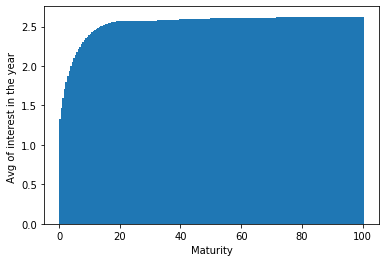

In [11]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 22 weeks

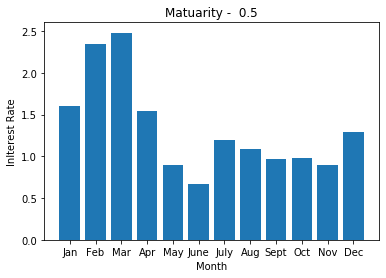

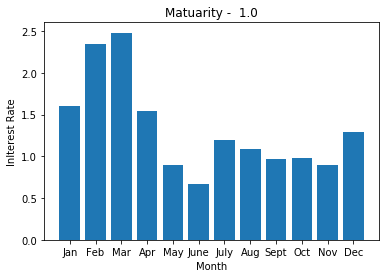

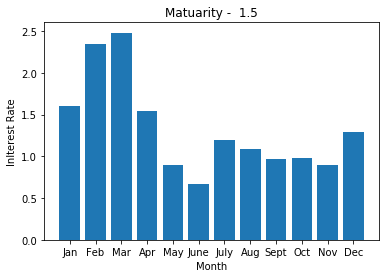

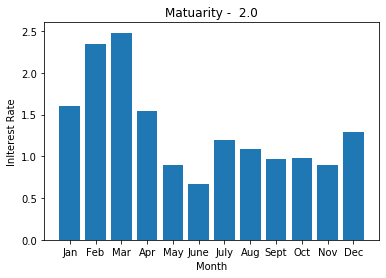

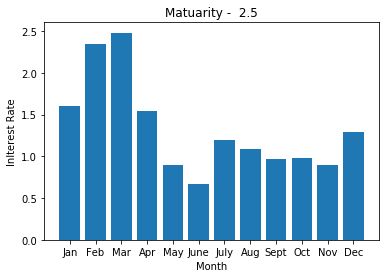

...

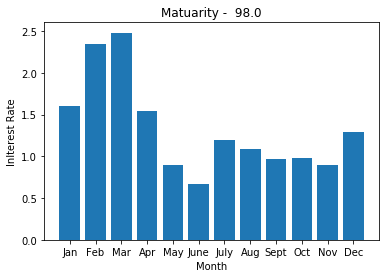

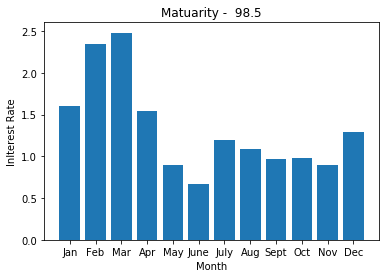

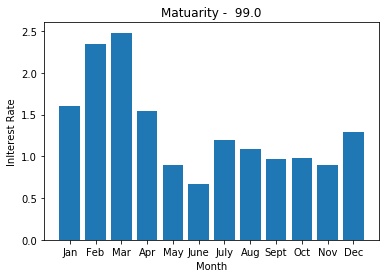

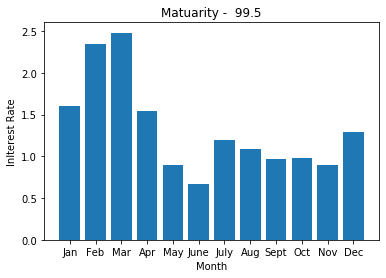

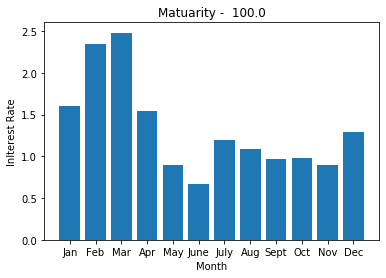

In [12]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

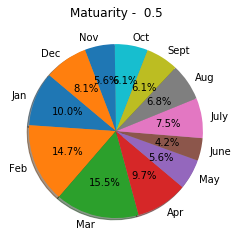

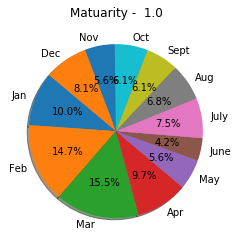

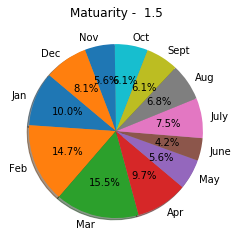

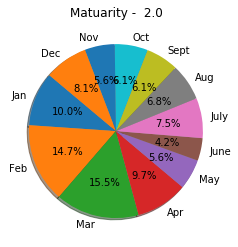

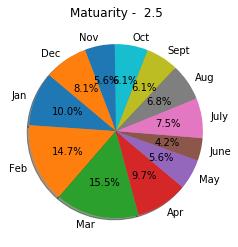

...

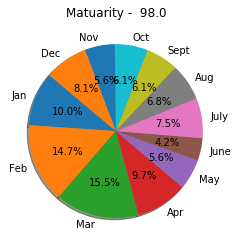

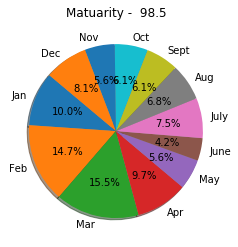

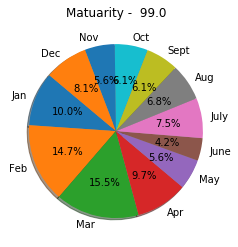

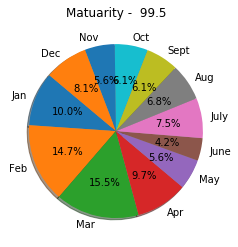

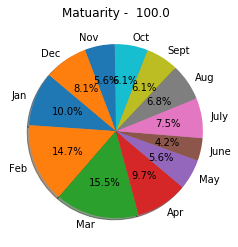

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

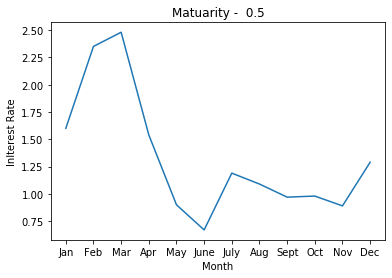

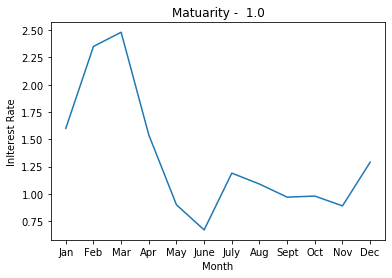

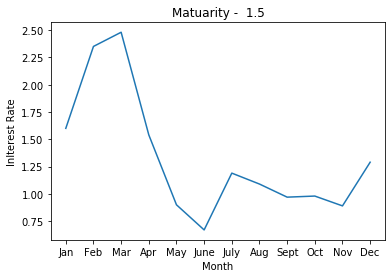

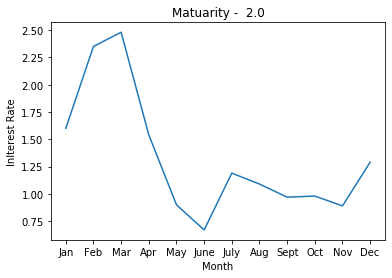

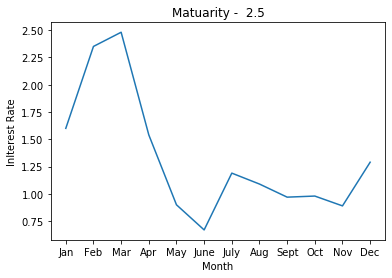

...

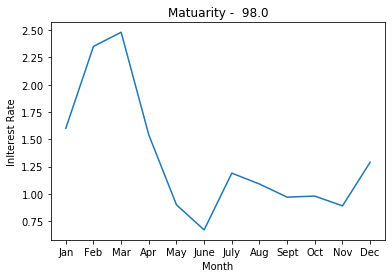

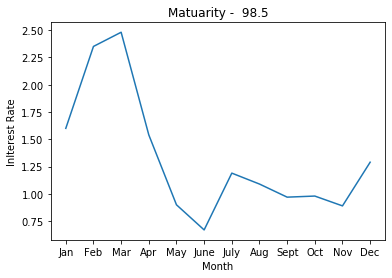

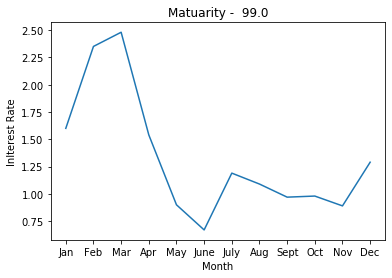

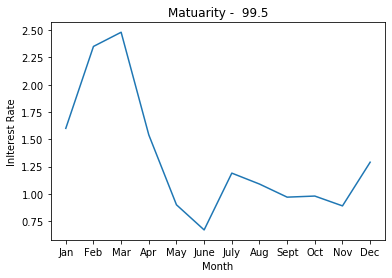

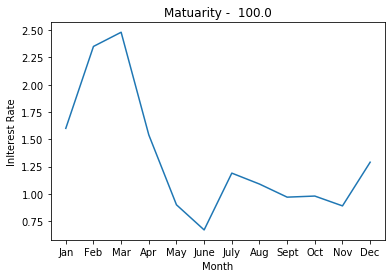

In [15]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

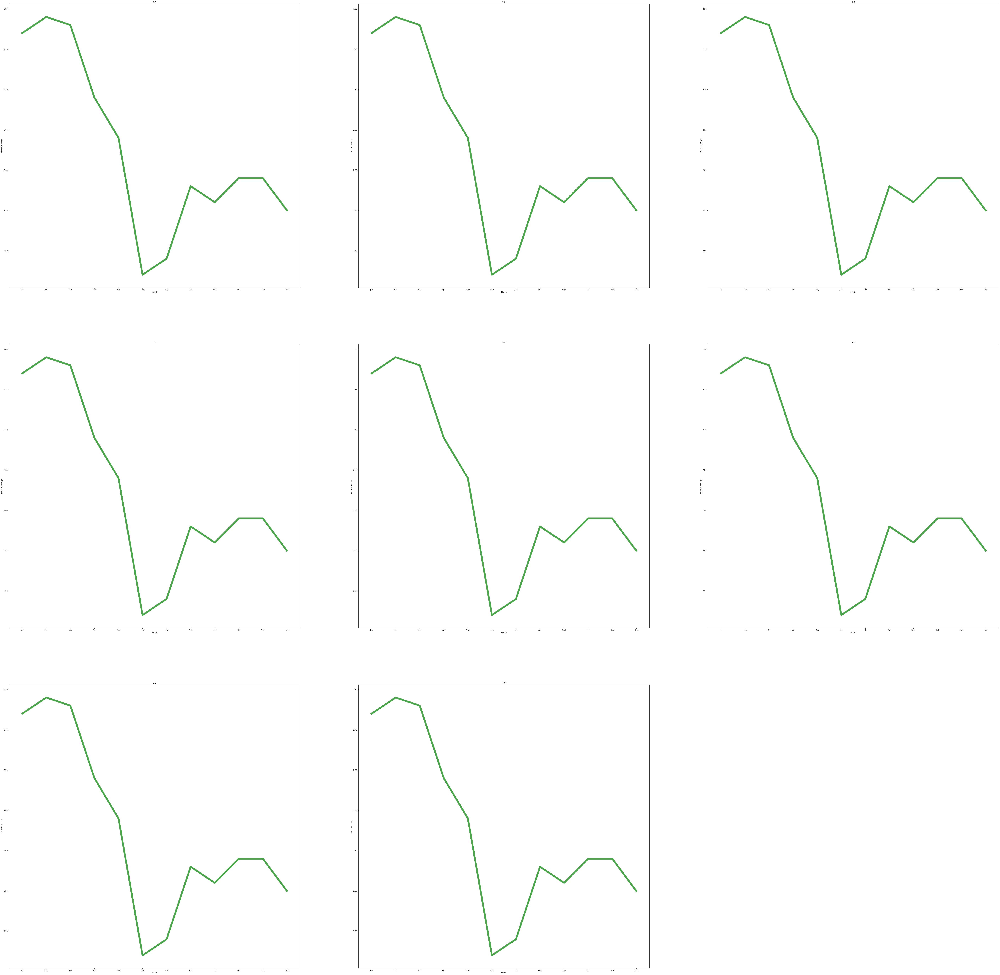

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

General Best interest in the year of 2002 is in the month of _____ and lowest in _____ , safe time is _____ to _____ over all trend understanding


In [18]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

2.5377708333333335